In [2]:
import numpy as np
import segyio
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText

In [3]:
# Set the default plot size for matplotlib figures
matplotlib.rcParams['figure.figsize'] = (11.75, 8.5)

In [9]:
base_segy = 'Seismic_data.sgy'

In [10]:
f = segyio.open(base_segy, ignore_geometry = True)
segyio.tools.wrap(f.text[0])

'/`\x04\x16\x16_?`??>>/?>?\x06/>/??>\x05??>/\x04\x04\x05??>/\x04\x04>\x05%>\x05`>\x05%>\x16\x05`>\x16\x07\x15\x06\x04\x06\x07\x16\x15\x16\x04\x06\x16\x04\x16\x16\x04\x07\x15\x06\x16\x04\x06\x04\x16\x16\x16\x16\x16\n\x16\x16\x16\x16\x04\x16\x16\x16\x07`\x07\x16\x04/_%__+<'

In [11]:
print(segyio.tools.wrap(f.text[0]))

/`_?`??>>/?>?/>/??>??>/??>/>%>`>%>`>
`/_%__+<


In [12]:
f.samples[:5]

array([ 4.,  8., 12., 16., 20.])

In [13]:
with segyio.open(base_segy) as segyf:
    n_traces = segyf.tracecount
    sample_rate = segyio.tools.dt(segyf)
    n_samples = segyf.samples.size
    n_il = len(segyf.iline)

ValueError: Invalid dimensions, ilines (631) * xlines (951) * offsets (1) should match the number of traces (600515)

In [14]:
f = segyio.open(base_segy, ignore_geometry = True)
ntraces    = len(f.trace)
inlines    = []
crosslines = []

for i in range(ntraces):
    headeri = f.header[i]
    inlines.append(headeri[segyio.su.iline])
    crosslines.append(headeri[segyio.su.xline])

print(f'{ntraces} traces')
print(f'first 10 inlines: {inlines[:10]}')
print(f'first 10 crosslines: {crosslines[:10]}')

600515 traces
first 10 inlines: [100, 100, 100, 100, 100, 100, 100, 100, 100, 100]
first 10 crosslines: [300, 301, 302, 303, 304, 305, 306, 307, 308, 309]


In [15]:
inlines = []
crosslines = []
for h in f.header:
    inlines.append(h[segyio.su.iline])
    crosslines.append(h[segyio.su.xline])
        
print(f'{ntraces} traces')
print(f'first 10 inlines: {inlines[:10]}')
print(f'first 10 crosslines: {crosslines[:10]}')

600515 traces
first 10 inlines: [100, 100, 100, 100, 100, 100, 100, 100, 100, 100]
first 10 crosslines: [300, 301, 302, 303, 304, 305, 306, 307, 308, 309]


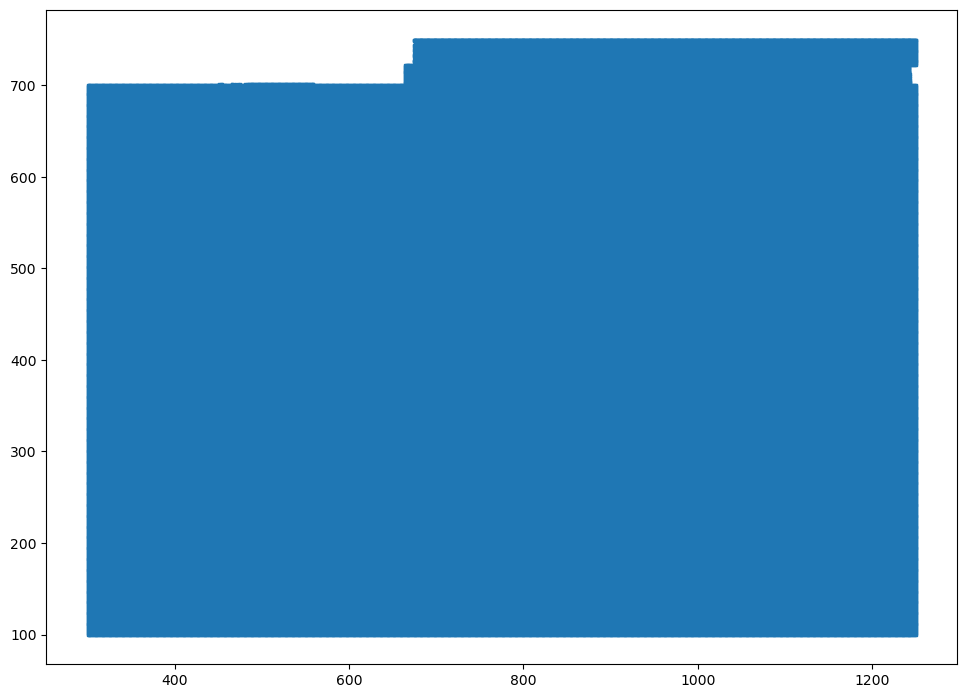

In [16]:
# Plot the inline and crossline as a scatter plot
plt.scatter(crosslines, inlines, marker="s", s=1)

In [18]:
import itertools
uniqil = set(inlines)
uniqxl = set(crosslines)
real = set(zip(inlines, crosslines))
grid = set(itertools.product(uniqil, uniqxl))
missing = grid - real
missing

{(712, 614),
 (734, 373),
 (720, 438),
 (706, 540),
 (725, 553),
 (706, 311),
 (744, 566),
 (711, 618),
 (747, 312),
 (711, 389),
 (750, 317),
 (741, 497),
 (727, 599),
 (746, 612),
 (708, 320),
 (727, 370),
 (713, 435),
 (732, 448),
 (718, 550),
 (704, 615),
 (726, 374),
 (745, 387),
 (743, 314),
 (748, 658),
 (729, 379),
 (734, 494),
 (720, 559),
 (701, 317),
 (739, 609),
 (720, 330),
 (706, 432),
 (747, 433),
 (706, 661),
 (711, 510),
 (750, 438),
 (741, 618),
 (722, 376),
 (741, 389),
 (727, 491),
 (713, 556),
 (735, 315),
 (732, 569),
 (726, 495),
 (745, 508),
 (738, 320),
 (743, 435),
 (748, 550),
 (734, 615),
 (715, 336),
 (701, 438),
 (720, 451),
 (706, 553),
 (747, 554),
 (711, 631),
 (747, 325),
 (733, 390),
 (750, 559),
 (731, 317),
 (750, 330),
 (736, 395),
 (722, 497),
 (741, 510),
 (727, 612),
 (708, 333),
 (713, 448),
 (704, 628),
 (745, 629),
 (726, 387),
 (745, 400),
 (743, 556),
 (710, 379),
 (748, 671),
 (729, 392),
 (715, 457),
 (720, 572),
 (701, 330),
 (742, 331),

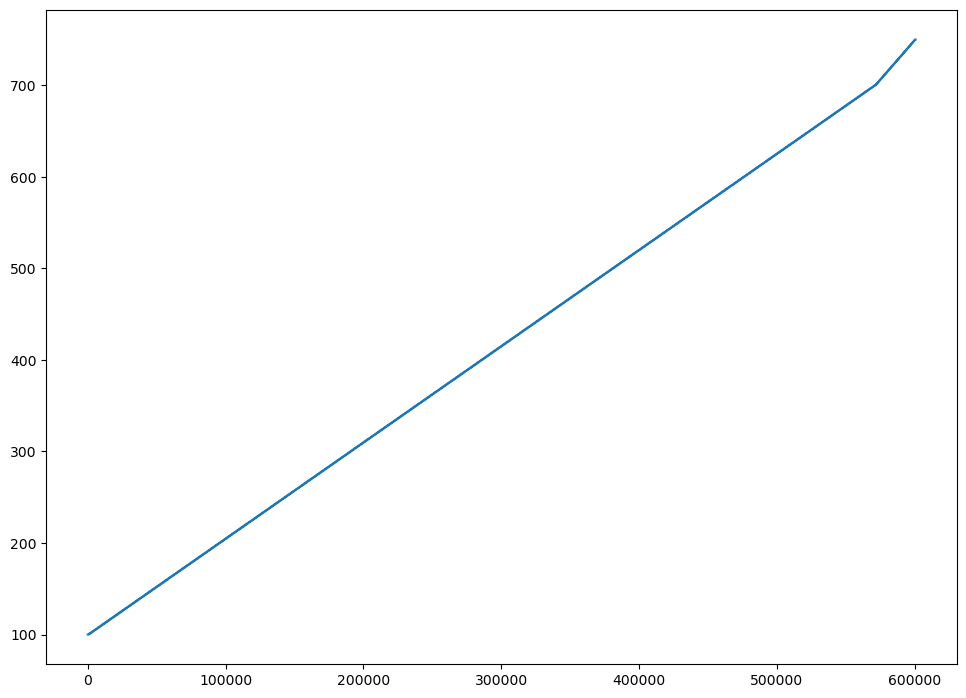

In [19]:
plt.plot(inlines)

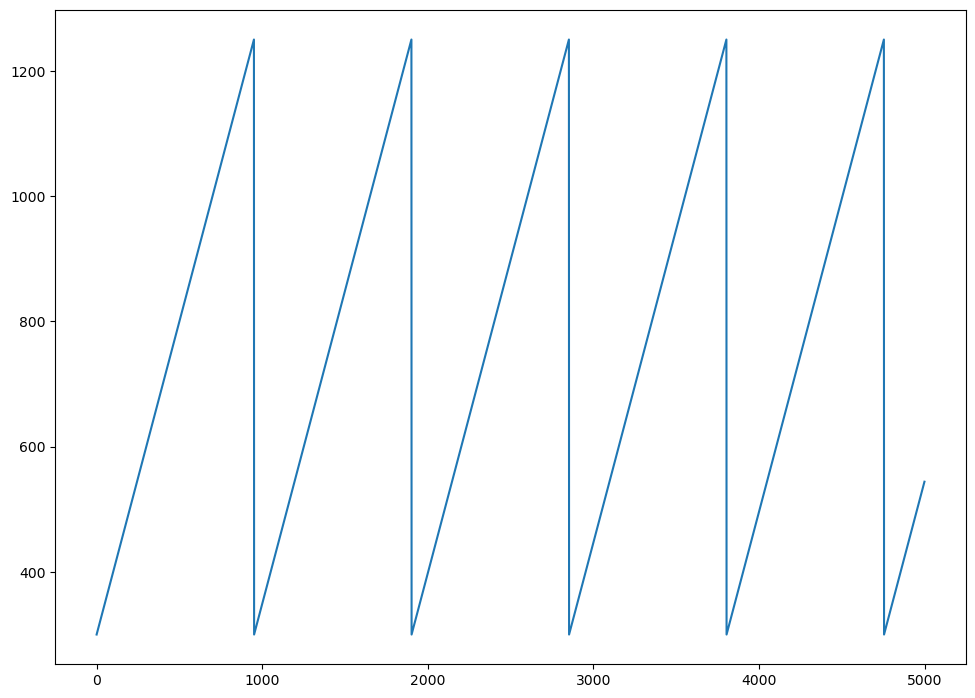

In [20]:
plt.plot(crosslines[:5000])

In [21]:
import numpy as np
ils = np.unique(inlines)
xls = np.unique(crosslines)
inline_interval    = ils[1:] - ils[:-1]
crossline_interval = xls[1:] - xls[:-1]
print(inline_interval)
print(crossline_interval)

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 

In [22]:
ils = sorted(uniqil)
xls = sorted(uniqxl)
lineindex = {
    (il, xl): i
    for i, (il, xl) in enumerate(sorted(grid))

}
lineindex

{(100, 300): 0,
 (100, 301): 1,
 (100, 302): 2,
 (100, 303): 3,
 (100, 304): 4,
 (100, 305): 5,
 (100, 306): 6,
 (100, 307): 7,
 (100, 308): 8,
 (100, 309): 9,
 (100, 310): 10,
 (100, 311): 11,
 (100, 312): 12,
 (100, 313): 13,
 (100, 314): 14,
 (100, 315): 15,
 (100, 316): 16,
 (100, 317): 17,
 (100, 318): 18,
 (100, 319): 19,
 (100, 320): 20,
 (100, 321): 21,
 (100, 322): 22,
 (100, 323): 23,
 (100, 324): 24,
 (100, 325): 25,
 (100, 326): 26,
 (100, 327): 27,
 (100, 328): 28,
 (100, 329): 29,
 (100, 330): 30,
 (100, 331): 31,
 (100, 332): 32,
 (100, 333): 33,
 (100, 334): 34,
 (100, 335): 35,
 (100, 336): 36,
 (100, 337): 37,
 (100, 338): 38,
 (100, 339): 39,
 (100, 340): 40,
 (100, 341): 41,
 (100, 342): 42,
 (100, 343): 43,
 (100, 344): 44,
 (100, 345): 45,
 (100, 346): 46,
 (100, 347): 47,
 (100, 348): 48,
 (100, 349): 49,
 (100, 350): 50,
 (100, 351): 51,
 (100, 352): 52,
 (100, 353): 53,
 (100, 354): 54,
 (100, 355): 55,
 (100, 356): 56,
 (100, 357): 57,
 (100, 358): 58,
 (100, 

In [23]:
d = np.zeros((len(ils), len(xls), len(f.samples)))
lineard = d.reshape(d.shape[0] * d.shape[1], d.shape[2])
for il, xl, trace in zip(inlines, crosslines, f.trace[:]):
    lineard[lineindex[il, xl]][:] = trace[:]

In [24]:
d.shape

(651, 951, 462)

In [25]:
# Set up some aliases
ilines = np.array(sorted(uniqil))
xlines = np.array(sorted(uniqxl))
t = np.array(f.samples)

# Estimate the amplitude range to use for the plots by taking the 95th percentile

vm = np.percentile(d, 95)
print(vm)

# Define the central line
central = len(ilines) // 2

3856.0


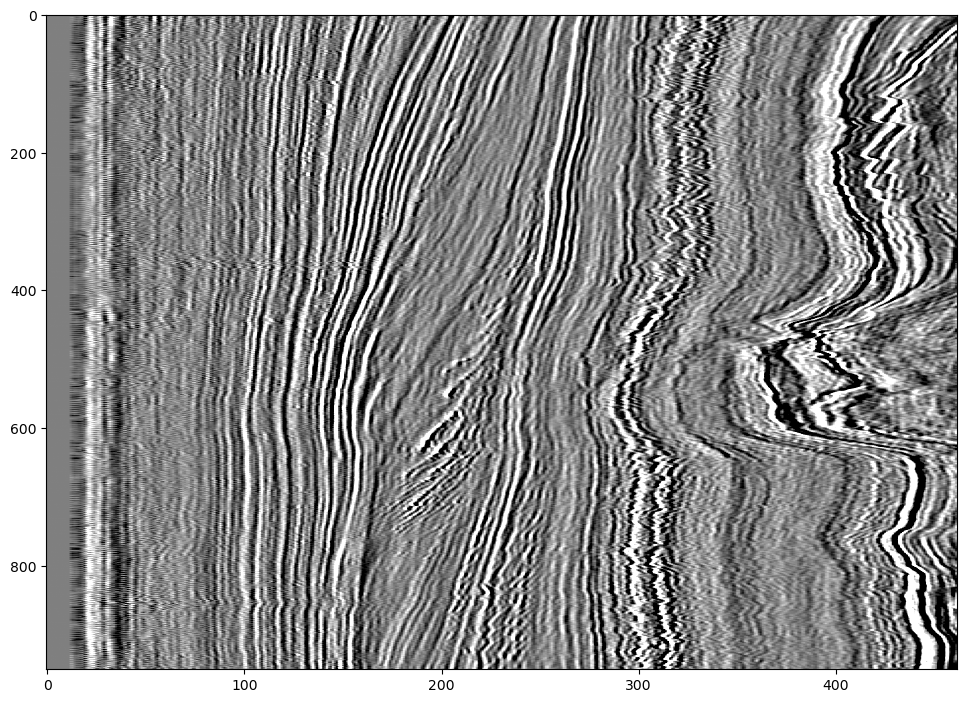

In [26]:
# Plot

plt.imshow(d[central,:,:], cmap='gray', aspect='auto', vmin=-vm, vmax=vm)
plt.show()

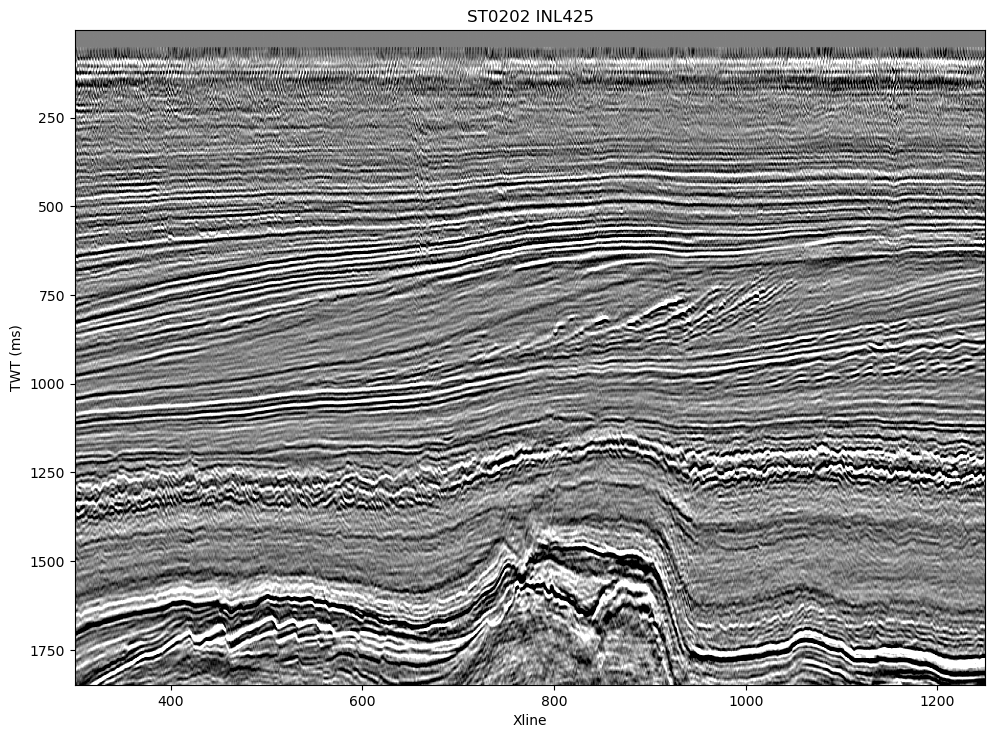

In [27]:
extent = [xlines[0], xlines[-1], t[-1], t[0]]

# Plot the central inline in the usual orientation by transposing the data

plt.imshow(d[central,:,:].T, cmap='gray', aspect='auto', vmin=-vm, vmax=vm, extent=extent)

plt.xlabel('Xline')
plt.ylabel('TWT (ms)')
plt.title('ST0202 INL'+ str(ilines[central]))
plt.show()

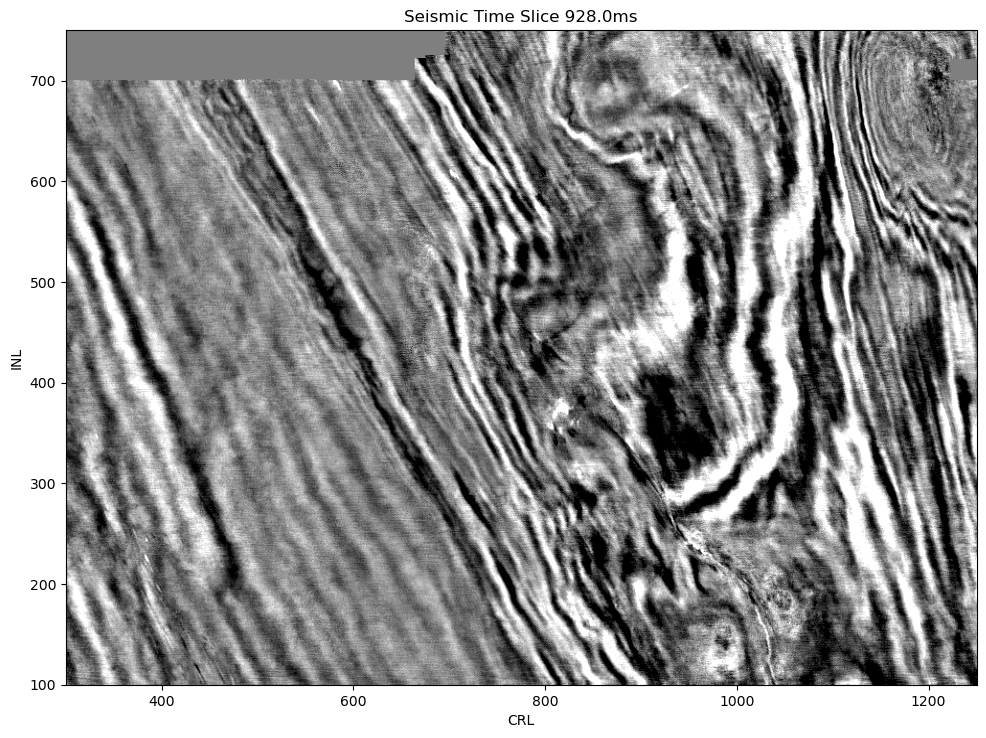

In [31]:
# Central time slice

tmid = len(t)//2

extent = [xlines[0], xlines[-1], ilines[0], ilines[-1]]

plt.imshow(d[:,:,tmid], cmap='gray', origin='lower', aspect='auto', vmin=-vm, vmax=vm, extent=extent)

plt.xlabel('CRL')
plt.ylabel('INL')
plt.title('Seismic Time Slice '+ str(t[tmid])+'ms')
plt.show()

In [32]:
import xarray as xr
import hvplot.xarray
import panel as pn

In [33]:
# Set the default image size
from holoviews import opts

opts.defaults(
    opts.Image(
        width=800, height=600))

In [34]:
# Define a plotting function, the input will be the inline

def plot_inl(inl):
    """
    Plot a single inline using hvplot
    """
    idx = inl - ilines[0]
    da = xr.DataArray(d[idx,:,:].T)    
    p = da.hvplot.image(clim=(-vm, vm), cmap='gray', flip_yaxis=True) 
    return p

In [35]:
plot_inl(ilines[central])

:Image   [dim_1,dim_0]   (value)

In [36]:
# Use panel to pass an array of ilines to the function

pn.interact(plot_inl, inl = ilines)

Column(sizing_mode='fixed')
    [0] Column
        [0] DiscreteSlider(formatter='%d', name='inl', options=[100, 101, 102, ...], value=100)
    [1] Row(sizing_mode='fixed')
        [0] HoloViews(Image, height=600, name='interactive01450', sizing_mode='fixed', width=800)

In [37]:
line_select = pn.widgets.Select(name='INL Selection', options=ilines.tolist())

pn.interact(plot_inl, inl = line_select)

Column(sizing_mode='fixed')
    [0] Column
        [0] Select(name='INL Selection', options=[100, 101, 102, ...], value=100)
    [1] Row(sizing_mode='fixed')
        [0] HoloViews(Image, height=600, name='interactive01546', sizing_mode='fixed', width=800)

In [38]:
#Create a Data Array
da = xr.DataArray(data = d,
                  dims = ['il','xl','twt'],
                  coords = {'il': ilines,
                          'xl': xlines,
                          'twt': t})

In [39]:
# Take a look
da

<xarray.DataArray (il: 651, xl: 951, twt: 462)>
array([[[    0.,     0.,     0., ...,  -685.,  -569.,  1405.],
        [    0.,     0.,     0., ..., -2683., -2175.,   774.],
        [    0.,     0.,     0., ..., -1588., -1499.,   473.],
        ...,
        [    0.,     0.,     0., ...,  -971.,  -832., -1247.],
        [    0.,     0.,     0., ..., -1702., -1506., -1023.],
        [    0.,     0.,     0., ..., -2689., -1088.,   -31.]],

       [[    0.,     0.,     0., ...,  -460.,  -428.,  1457.],
        [    0.,     0.,     0., ...,    99., -1130.,  -275.],
        [    0.,     0.,     0., ...,  -635.,  -609.,  1149.],
        ...,
        [    0.,     0.,     0., ...,   -86., -1462., -2220.],
        [    0.,     0.,     0., ..., -1173., -1277., -1643.],
        [    0.,     0.,     0., ..., -1783., -1278.,  -685.]],

       [[    0.,     0.,     0., ..., -1178., -1158.,  1350.],
        [    0.,     0.,     0., ...,  -900.,  -641.,  1392.],
        [    0.,     0.,     0., ...,  -790., -1096.,  1002.],
        ...,
...
        ...,
        [    0.,   132.,   162., ..., -3057., -2271.,   272.],
        [    0.,     9.,   507., ...,   715.,   852.,  -949.],
        [    0.,   208.,   314., ...,  3215., -1630.,  -479.]],

       [[    0.,     0.,     0., ...,     0.,     0.,     0.],
        [    0.,     0.,     0., ...,     0.,     0.,     0.],
        [    0.,     0.,     0., ...,     0.,     0.,     0.],
        ...,
        [    0.,   -28.,   344., ..., -3085., -4846.,   819.],
        [  -91.,  -227.,   182., ..., -4353.,   769.,  3558.],
        [    0.,   -71.,   361., ...,  1820.,  1069.,   317.]],

       [[    0.,     0.,     0., ...,     0.,     0.,     0.],
        [    0.,     0.,     0., ...,     0.,     0.,     0.],
        [    0.,     0.,     0., ...,     0.,     0.,     0.],
        ...,
        [  320.,   138.,  -319., ...,  -978.,  2056.,   572.],
        [  181.,  -156.,  -100., ..., -3672., -2624.,   888.],
        [   73.,   -42.,  -117., ...,   620.,  -915.,  -217.]]])
Coordinates:
  * il       (il) int32 100 101 102 103 104 105 106 ... 745 746 747 748 749 750
  * xl       (xl) int32 300 301 302 303 304 305 ... 1246 1247 1248 1249 1250
  * twt      (twt) float64 4.0 8.0 12.0 16.0 ... 1.84e+03 1.844e+03 1.848e+03

In [41]:
da.sel(twt = 300)

<xarray.DataArray (il: 651, xl: 951)>
array([[    0.,     0.,     0., ...,  -315.,  -892.,     0.],
       [ 2098.,   749.,  1218., ...,   -33.,   479.,  3051.],
       [ 2210.,  1280.,  1629., ..., -1032.,  -481.,  1372.],
       ...,
       [    0.,     0.,     0., ...,   227.,  2463.,  1902.],
       [    0.,     0.,     0., ...,  -333.,  1530.,    53.],
       [    0.,     0.,     0., ...,  -980.,   200.,  1459.]])
Coordinates:
  * il       (il) int32 100 101 102 103 104 105 106 ... 745 746 747 748 749 750
  * xl       (xl) int32 300 301 302 303 304 305 ... 1246 1247 1248 1249 1250
    twt      float64 300.0

In [44]:
da[:,:,461]

<xarray.DataArray (il: 651, xl: 951)>
array([[ 1405.,   774.,   473., ..., -1247., -1023.,   -31.],
       [ 1457.,  -275.,  1149., ..., -2220., -1643.,  -685.],
       [ 1350.,  1392.,  1002., ..., -2519., -1742.,  -977.],
       ...,
       [    0.,     0.,     0., ...,   272.,  -949.,  -479.],
       [    0.,     0.,     0., ...,   819.,  3558.,   317.],
       [    0.,     0.,     0., ...,   572.,   888.,  -217.]])
Coordinates:
  * il       (il) int32 100 101 102 103 104 105 106 ... 745 746 747 748 749 750
  * xl       (xl) int32 300 301 302 303 304 305 ... 1246 1247 1248 1249 1250
    twt      float64 1.848e+03

In [45]:
# To select a range we use slice
da.sel(twt = slice(2000,3000))

<xarray.DataArray (il: 651, xl: 951, twt: 0)>
array([], shape=(651, 951, 0), dtype=float64)
Coordinates:
  * il       (il) int32 100 101 102 103 104 105 106 ... 745 746 747 748 749 750
  * xl       (xl) int32 300 301 302 303 304 305 ... 1246 1247 1248 1249 1250
  * twt      (twt) float64

In [46]:
# Add some attribute information to the datarray
da.attrs['Year'] = '2002'
da.attrs['Type'] = 'Final PSDM time converted'

# Create a dataset
volve_ds = da.to_dataset(name = 'base')

# Add some attribute information to the dataset
volve_ds.attrs['Country'] = 'Norway'
volve_ds.attrs['Field'] = 'Volve'

# Take a look
volve_ds

<xarray.Dataset>
Dimensions:  (il: 651, xl: 951, twt: 462)
Coordinates:
  * il       (il) int32 100 101 102 103 104 105 106 ... 745 746 747 748 749 750
  * xl       (xl) int32 300 301 302 303 304 305 ... 1246 1247 1248 1249 1250
  * twt      (twt) float64 4.0 8.0 12.0 16.0 ... 1.84e+03 1.844e+03 1.848e+03
Data variables:
    base     (il, xl, twt) float64 0.0 0.0 0.0 0.0 ... 620.0 -915.0 -217.0
Attributes:
    Country:  Norway
    Field:    Volve